# Caravana data understanding

In [1]:
import math
import sys
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import itertools
import datetime

from collections import defaultdict
from scipy.stats.stats import pearsonr

# CAMBIATE IL PATH PER FARLO FUNZIONARE NEL VOSTRO PC
df = pd.read_csv('./data/training.csv')
np.set_printoptions(threshold=sys.maxsize)

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
df.dtypes

def extract_regex_from_col(fromCol, toCol, array):
    newCol = []
    for index, row in df.iterrows():
        found = False
        i = 0
        while not found and i < len(array):
            if array[i] in str(row[fromCol]):
                df.loc[index,fromCol] = row[fromCol].replace(array[i],"").replace("  ", " ").strip()
                newCol.append(array[i])
                found = True
            i += 1
        if not found:
            newCol.append(np.NaN)
    df[toCol] = newCol

def find_outliers(x, field, update=False):
    global candidates_outlier # necessario global perchè lavoro su raggruppamenti
    mode = x[field].mode()[0] if len(x[field].mode()) else np.NaN
    for index, row in x.iterrows():
        if row[field] != mode:
            candidates_outlier = candidates_outlier.append(row, ignore_index=True)
            if update:
                df.loc[df.RefId == row.RefId,field] = mode
    return candidates_outlier

In [2]:
df.shape

(58386, 34)

In [3]:
df.describe()

,RefId,IsBadBuy,VehYear,VehicleAge,WheelTypeID,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,BYRNO,VNZIP1,VehBCost,IsOnlineSale,WarrantyCost
count,58386.000000,58386.000000,58386.000000,58386.000000,55813.000000,58386.000000,58373.000000,58373.000000,58373.000000,58373.000000,58141.000000,58141.000000,58141.000000,58141.000000,58386.000000,58386.000000,58386.000000,58386.000000,58386.000000
mean,36567.888449,0.123454,2005.344637,4.174956,1.495566,71478.090518,6128.127953,7372.912699,8497.288558,9851.768061,6131.666655,7389.958652,8776.065118,10145.227034,26359.191519,58125.258195,6730.008335,0.025674,1276.105042
std,21092.254801,0.328961,1.733307,1.713833,0.520802,14591.224550,2456.632611,2715.506462,3151.106237,3378.839613,2432.171539,2682.310828,3086.373733,3304.637060,25804.795573,26146.806098,1762.075265,0.158162,598.885423
min,1.000000,0.000000,2001.000000,0.000000,0.000000,4825.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,835.000000,2764.000000,1.000000,0.000000,462.000000
25%,18270.250000,0.000000,2004.000000,3.000000,1.000000,61785.000000,4273.000000,5409.000000,6279.000000,7501.000000,4275.000000,5415.000000,6538.000000,7788.000000,17212.000000,32124.000000,5430.000000,0.000000,837.000000
50%,36608.500000,0.000000,2005.000000,4.000000,1.000000,73359.000000,6097.000000,7308.000000,8448.000000,9798.000000,6063.000000,7311.000000,8733.000000,10103.000000,19662.000000,74135.000000,6700.000000,0.000000,1155.000000
75%,54811.500000,0.000000,2007.000000,5.000000,2.000000,82427.000000,7765.000000,9017.000000,10652.000000,12084.000000,7737.000000,9014.000000,10910.000000,12309.000000,22808.000000,80022.000000,7900.000000,0.000000,1623.000000
max,73014.000000,1.000000,2010.000000,9.000000,3.000000,115717.000000,35722.000000,36859.000000,39080.000000,41482.000000,35722.000000,36859.000000,39080.000000,41062.000000,99761.000000,99224.000000,36485.000000,1.000000,7498.000000


In [4]:
df.duplicated().value_counts()

False    58386
dtype: int64

## Accuratezza Sintattica

In [5]:
df['Trim'] = df['Trim'].str.upper()
l = list()
for x in df['Trim'].unique():
    if not isinstance(x, str):
        l.append(str(x))
    else:
        l.append(x)

l.sort()
print(l)

['1', '150', '2', '250', '3', '3 R', 'ADV', 'BAS', 'C', 'CAR', 'CE', 'CIN', 'CLA', 'CUS', 'CX', 'CXL', 'CXS', 'DE', 'DEN', 'DS', 'DUR', 'DX', 'EC', 'EDD', 'EDG', 'EL', 'ENT', 'ES', 'EX', 'EX-', 'EXE', 'FX4', 'GL', 'GLE', 'GLS', 'GS', 'GT', 'GTC', 'GTP', 'GTS', 'GX', 'GXE', 'GXP', 'HER', 'HIG', 'HYB', 'I', 'JLS', 'JLX', 'KIN', 'L', 'L10', 'L20', 'L30', 'LAR', 'LE', 'LIM', 'LL', 'LS', 'LT', 'LTZ', 'LUX', 'LW2', 'LW3', 'LX', 'LXI', 'MAX', 'MAZ', 'NOR', 'OUT', 'OVE', 'OZ', 'PLU', 'PRE', 'PRO', 'R/T', 'RAL', 'REN', 'RS', 'RT', 'S', 'SC1', 'SC2', 'SE', 'SE-', 'SEL', 'SES', 'SI', 'SIG', 'SL', 'SL1', 'SL2', 'SLE', 'SLT', 'SPE', 'SPO', 'SPY', 'SR5', 'SS', 'ST', 'STA', 'STX', 'SV6', 'SVT', 'SX', 'SXT', 'T5', 'TOU', 'ULT', 'VAL', 'VP', 'W/T', 'X', 'XE', 'XL', 'XLS', 'XLT', 'XR', 'XRS', 'XS', 'XSP', 'Z71', 'ZR2', 'ZTS', 'ZTW', 'ZX2', 'ZX3', 'ZX4', 'ZX5', 'ZXW', 'nan']


__EXE__ è corretto: è un trim level per le LINCOLN.

Ipotizziamo che SE- e EX- possano essere errori sintattici.

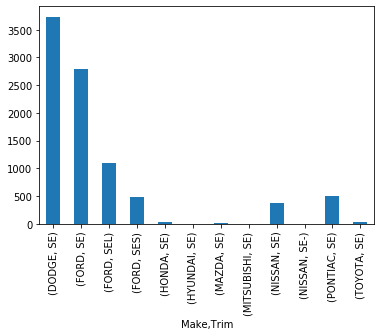

In [6]:
df[df['Trim'].notnull()].query('Trim.str.contains("SE")', engine='python')[['Make', 'Model', 'Trim']].groupby('Make')['Trim'].value_counts().plot(kind='bar')
plt.show()

In [7]:
df[((df['Trim']=='SE') | (df['Trim']=='SE-')) & (df['Make']=='NISSAN')][['Trim','Model','SubModel']].groupby(['Model', 'SubModel'])['Trim'].value_counts()

Model                 SubModel                          Trim
ALTIMA                4D SEDAN S                        SE      3 
                      4D SEDAN SE                       SE      34
ALTIMA 3.5L V6 MPI    4D SEDAN SE                       SE      6 
ALTIMA MFI V6 3.5L D  4D SEDAN SE                       SE      1 
FRONTIER PICKUP 2WD   CREW CAB 3.3L                     SE      4 
                      CREW CAB 3.3L SE                  SE      1 
                      CREW CAB 3.3L XE                  SE      4 
MAXIMA                4D SEDAN                          SE      1 
                      4D SEDAN SE                       SE      60
                      4D SEDAN SL                       SE      5 
MAXIMA 3.5L V6 MPI    4D SEDAN SE                       SE      32
                      4D SEDAN SL                       SE      2 
MAXIMA 3.5L V6 MPI /  4D SEDAN SE                       SE      7 
MAXIMA MFI V6 3.5L D  4D SEDAN SE                       SE      15
M

Wikipedia, alla pagina dedicata alla __Nissan Sentra__ conferma che il trim level corretto per questa macchina è SE-R. Era intuibile anche dall'attributo __SubModel__

In [8]:
df.loc[df['Trim']=='SE-', 'Trim']='SE-R'

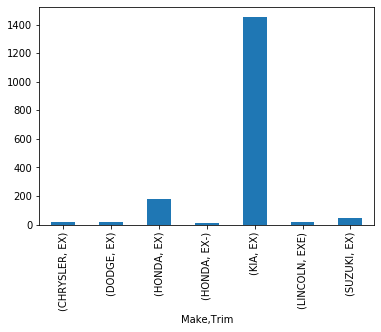

In [9]:
df[df['Trim'].notnull()].query('Trim.str.contains("EX")', engine='python')[['Make', 'Model', 'Trim']].groupby('Make')['Trim'].value_counts().plot(kind='bar')
plt.show()

In [10]:
df[((df['Trim']=='EX') | (df['Trim']=='EX-')) & (df['Make']=='HONDA')][['Trim','Model','SubModel']].groupby(['Model', 'SubModel'])['Trim'].value_counts()

Model                 SubModel                     Trim
ACCORD 4C             2D COUPE EX 5SP              EX      4 
                      2D COUPE EX AUTO             EX      13
                      4D SEDAN EX 5SP              EX      2 
                      4D SEDAN EX AUTO             EX      32
ACCORD 4C 2.4L I-4 M  2D COUPE EX AUTO             EX      1 
                      4D SEDAN EX AUTO             EX      3 
ACCORD 4C 2.4L I4 MP  2D COUPE EX AUTO             EX      5 
                      4D SEDAN EX AUTO             EX      7 
ACCORD 4C MFI I-4 2.  2D COUPE EX AUTO             EX      2 
                      4D SEDAN EX AUTO             EX      2 
ACCORD V6             2D COUPE EX 6SP              EX      1 
                      2D COUPE EX AUTO             EX      12
                      4D SEDAN AUTO                EX      2 
                      4D SEDAN EX AUTO             EX      16
                      4D SEDAN EX AUTO NAVIGATION  EX      2 
ACCORD V6 3.0L

In [11]:
df.loc[df['Trim']=='EX-', 'Trim']='EX-P'

Controllato il __SubModel__ dei veicoli si potrebbe pensare che EX- o SE- abbiamo subito la cancellazione di un carattere. Preferiamo non aumentare la granularità dell'attributo __Trim__ e quindi correggiamo semplicemente eliminando il trattino.

Dei controlli a campione evidenziano come il modello di alcuni veicoli presenti un carattere terminante probabilmente frutto di un errore sintattico.

In [12]:
df[df['Model'].notnull()].query('Model.str.endswith("/")', engine='python')['Model'].value_counts()

COBALT 2.2L I4 MPI /    33
ALTIMA 2.5L I4 MPI /    28
G6 4C 2.4L I4 MFI /     25
MAZDA6 2.3L I4 MFI /    24
FOCUS 2.0L I4 SFI /     15
BEETLE 2.0L I4 MFI /    11
SENTRA 1.8L I4 EFI /    10
G6 V6 3.5L V6 MFI /     9 
MAZDA6 3.0L V6 MFI /    7 
MAXIMA 3.5L V6 MPI /    7 
TAURUS 3.0L V6 EFI /    7 
FOCUS 2.0L I4 MFI /     7 
FORENZA 2.0L I4 DI /    7 
TAURUS 3.5L V6 24V /    5 
MAZDA5 2.3L I4 MFI /    5 
BEETLE 2.0L I4 EFI /    3 
QUEST 3.5L V6 EFI /     3 
MAZDA3 2.0L I4 MFI /    3 
XG 350 3.5L V6 EFI /    2 
SABLE 3.5L V6 24V /     1 
CIVIC 1.7L I4 MFI /     1 
IMPALA 3.5L V6 MPI /    1 
Name: Model, dtype: int64

Per esempio:

In [13]:
df[df['Model']=='COBALT 2.2L I4 MPI']

,RefId,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
318,19684,0,7/7/2009,OTHER,2005,4,CHEVROLET,COBALT 2.2L I4 MPI,LS,4D SEDAN,BEIGE,AUTO,1.0,Alloy,73900,AMERICAN,COMPACT,GM,4862.0,5976.0,5751.0,6954.0,4830.0,5914.0,5716.0,6887.0,NaN,NaN,21053,95673,CA,5805.0,0,803
376,49588,0,1/28/2009,OTHER,2005,4,CHEVROLET,COBALT 2.2L I4 MPI,LS,4D SEDAN,SILVER,AUTO,1.0,Alloy,74951,AMERICAN,COMPACT,GM,4631.0,5814.0,5501.0,6779.0,11425.0,13393.0,12839.0,14964.0,NaN,NaN,835,85009,AZ,5970.0,0,803
385,2229,0,4/28/2009,ADESA,2007,2,CHEVROLET,COBALT 2.2L I4 MPI,LT,4D SEDAN LS,BLUE,AUTO,2.0,Covers,77390,AMERICAN,COMPACT,GM,6284.0,7104.0,7287.0,8172.0,6379.0,7208.0,7389.0,8285.0,NaN,NaN,8172,45005,OH,5865.0,0,803
594,52884,0,7/22/2009,MANHEIM,2006,3,CHEVROLET,COBALT 2.2L I4 MPI,LS,4D SEDAN LS,GOLD,AUTO,2.0,Covers,51894,AMERICAN,COMPACT,GM,4810.0,5899.0,5695.0,6871.0,4994.0,6101.0,5894.0,7089.0,NaN,NaN,18111,37122,TN,5750.0,0,671
703,15967,0,10/27/2009,MANHEIM,2007,2,CHEVROLET,COBALT 2.2L I4 MPI,LS,2D COUPE,SILVER,AUTO,2.0,Covers,58865,AMERICAN,COMPACT,GM,5975.0,6810.0,6953.0,7855.0,4827.0,5990.0,8865.0,10011.0,NaN,NaN,25100,77041,TX,5575.0,0,671
752,65563,0,10/14/2009,MANHEIM,2006,3,CHEVROLET,COBALT 2.2L I4 MPI,LS,4D SEDAN LS,BLUE,AUTO,2.0,Covers,45643,AMERICAN,COMPACT,GM,4950.0,6074.0,5846.0,7060.0,4398.0,5363.0,8215.0,9072.0,NaN,NaN,3453,84087,UT,5315.0,0,623
1229,72880,0,9/16/2009,ADESA,2006,3,CHEVROLET,COBALT 2.2L I4 MPI,LS,4D SEDAN LS,RED,AUTO,2.0,Covers,79174,AMERICAN,COMPACT,GM,5209.0,6455.0,6126.0,7471.0,4832.0,5913.0,5719.0,6886.0,NaN,NaN,20740,30212,GA,4900.0,0,803
1364,34866,0,2/4/2009,MANHEIM,2005,4,CHEVROLET,COBALT 2.2L I4 MPI,BAS,4D SEDAN,GREEN,AUTO,2.0,Covers,68198,AMERICAN,COMPACT,GM,4631.0,5814.0,5501.0,6779.0,7346.0,8450.0,8434.0,9626.0,NaN,NaN,19064,75236,TX,5670.0,0,728
1373,69604,0,3/4/2009,ADESA,2005,4,CHEVROLET,COBALT 2.2L I4 MPI,LS,2D COUPE,RED,AUTO,1.0,Alloy,72312,AMERICAN,COMPACT,GM,4971.0,5999.0,5869.0,6979.0,5023.0,6100.0,5925.0,7088.0,NaN,NaN,21053,85226,AZ,5175.0,0,803
1393,16436,0,6/10/2009,MANHEIM,2005,4,CHEVROLET,COBALT 2.2L I4 MPI,BAS,4D SEDAN,WHITE,AUTO,2.0,Covers,57910,AMERICAN,COMPACT,GM,4794.0,5943.0,5678.0,6918.0,5048.0,6224.0,5952.0,7222.0,NaN,NaN,20928,32824,FL,6100.0,0,671


Eliminiamo questo carattere per tutti i valori di __Model__.

In [14]:
to_be_fixed = df[df['Model'].notnull()].query('Model.str.endswith("/")', engine='python')['Model'].unique()

for model in to_be_fixed:
    df.loc[df['Model']==model, 'Model'] = model[:-2]  # -2 because I need to remove ' /' (the leading space) 

Vogliamo che tutti gli attributi categorici abbiano lo stesso tipo (maiuscolo), per evitare di avere falsi duplicati.

In [15]:
not_upper = [x for x in df['Model'].unique() if not x.isupper()]
not_upper

['300',
 'SANTA FE 4WD V6 Unsp',
 'GRAND AM V6 Unspecif',
 'LE SABRE Unspecified',
 'COROLLA Multiple Eng',
 'MATRIX 2WD Multiple',
 'MUSTANG V6 Unspecifi',
 'GALANT 4C Multiple E',
 'CAMRY 4C Multiple En',
 'AVENGER V6 Unspecifi',
 'Pacifica',
 'ALTIMA Multiple Engi',
 'FOCUS Multiple Engin',
 'RAV-4 2WD Multiple E',
 'XG 300 Unspecified',
 'SPORTAGE 2WD Multipl',
 'CAMRY SOLARA 4C Mult',
 'ECHO Multiple Engine',
 'MATRIX 2WD Unspecifi']

In [16]:
df[df['Model'].isin(not_upper)]['Model'].value_counts()

300                     191
LE SABRE Unspecified    26 
GALANT 4C Multiple E    9  
MUSTANG V6 Unspecifi    9  
GRAND AM V6 Unspecif    5  
MATRIX 2WD Multiple     4  
COROLLA Multiple Eng    3  
AVENGER V6 Unspecifi    3  
CAMRY SOLARA 4C Mult    2  
CAMRY 4C Multiple En    2  
SPORTAGE 2WD Multipl    2  
XG 300 Unspecified      2  
FOCUS Multiple Engin    2  
RAV-4 2WD Multiple E    1  
ALTIMA Multiple Engi    1  
Pacifica                1  
ECHO Multiple Engine    1  
MATRIX 2WD Unspecifi    1  
SANTA FE 4WD V6 Unsp    1  
Name: Model, dtype: int64

Esempio di come è possibile verificare gli errori.

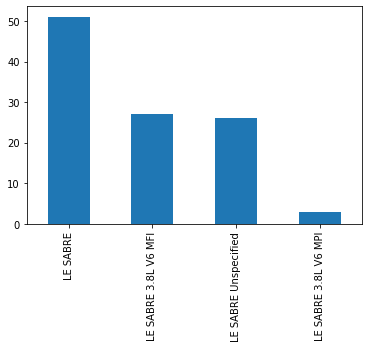

In [17]:
df[df['Model'].notnull()].query('Model.str.contains("LE SABRE")', engine='python')[['Make', 'Model']]['Model'].value_counts().plot(kind='bar')

Notiamo che oltre alla presenza di modelli con il nome minuscolo, ce ne sono tanti che presentatno dei refusi. Per ognuno di questi dobbiamo controllare se esiste il corrispondente scrittto in maniera corretta.

In [18]:
model_unsp = df[df['Model'].notnull()].query('Model.str.contains("Unsp")', engine='python')['Model'].unique()
makes = df[['Make','Model', 'SubModel']].query('Model.str.contains("Unsp")', engine='python')

import re

for model in model_unsp:
    correct_model = re.sub(r' Unsp[A-Za-z]*', '', model)
    print(correct_model)
    df.loc[df['Model']==model, 'Model'] = correct_model

SANTA FE 4WD V6
GRAND AM V6
LE SABRE
MUSTANG V6
AVENGER V6
XG 300
MATRIX 2WD


In [19]:
mult_eng = df[df['Model'].notnull()].query('Model.str.contains("Mult")', engine='python')['Model'].unique()
makes = df[['Make','Model', 'SubModel']].query('Model.str.contains("Mult")', engine='python')

import re

for model in mult_eng:
    correct_model = re.sub(r' Mult[A-Za-z\s]*', '', model)
    print(correct_model)
    df.loc[df['Model']==model, 'Model'] = correct_model

COROLLA
MATRIX 2WD
GALANT 4C
CAMRY 4C
ALTIMA
FOCUS
RAV-4 2WD
SPORTAGE 2WD
CAMRY SOLARA 4C
ECHO


In [20]:
df.loc[df['Model']=='Pacifica', 'Model']='PACIFICA'


Nella maggior parte dei casi, l'attributo __Model__ contiene informazioni non strettamente collegate al modello del veicolo, come:
- Tipo di iniezione del carburante (MPI, EFI, SFI...)
- Numero di porte (4D, 2D)
- Trazione (4WD, FWD, 2WD, AWD)
Abbiamo deciso di creare un altra colonna che chiameremo __ModelSimple__ con tutti i modelli ripuliti da queste informazioni aggiuntive.

In [21]:
import re
df['ModelSimple']=[re.sub(r'V[0-9]|[0-9]\.[0-9]?L?|MPI|EFI|EF\b|MP\b|SF\b|SFI|MFI|MF\b|SPI|SOHC|DOHC?|[24AFR]WD|[2-6]C|I-[4-6]|I\s?[4-6]|\/|I-','', str(x)) for x in df['Model']]

In [22]:
df['ModelSimple']=[str(x).strip() for x in df['ModelSimple']]

In [23]:
df['ModelSimple']=[re.sub(r'SM\b|\s2\b|\sV\b|\s+DO\b|\s+DI\b',"",str(x)).strip() for x in df['ModelSimple']]

In [24]:
df.loc[df.ModelSimple=='XTERRA    I', 'ModelSimple']='XTERRA'
df.loc[df.ModelSimple=='XG 350    D', 'ModelSimple']='XG 350'
df.loc[(df.ModelSimple=='VUE     M') | (df.ModelSimple=='VUE     S'), 'ModelSimple']='VUE'
df.loc[df.ModelSimple=='VITARA    I', 'ModelSimple']='VITARA '
df.loc[df.ModelSimple=='VIBE     M', 'ModelSimple']='VIBE '
df.loc[(df.ModelSimple=='TUCSON    I'), 'ModelSimple']='TUCSON'
df.loc[(df.ModelSimple=='TRAILBLAZER   4'), 'ModelSimple']='TRAILBLAZER'
df.loc[df.ModelSimple=='TL   FI', 'ModelSimple']='TL'
df.loc[df.ModelSimple=='TC   16V', 'ModelSimple']='TC'
df.loc[(df.ModelSimple=='TAURUS    D') | (df.ModelSimple=='TAURUS    F') | (df.ModelSimple=='TAURUS    S') | (df.ModelSimple=='TAURUS   24V'), 'ModelSimple']='TAURUS'
df.loc[df.ModelSimple=='SUNFIRE   NA', 'ModelSimple']='SUNFIRE'
df.loc[(df.ModelSimple=='STRATUS    E') | (df.ModelSimple=='STRATUS    M') | (df.ModelSimple=='STRATUS    S'), 'ModelSimple']='STRATUS'
df.loc[(df.ModelSimple=='SPECTRA 5') | (df.ModelSimple=='SPECTRA 6-230250-1V'), 'ModelSimple']='SPECTRA'
df.loc[df.ModelSimple=='SONATA    M', 'ModelSimple']='SONATA'
df.loc[(df.ModelSimple=='SILHOUETTE   S') | (df.ModelSimple=='SILHOUETTE  6'), 'ModelSimple']='SILHOUETTE'
df.loc[df.ModelSimple=='SIENNA    D', 'ModelSimple']='SIENNA'
df.loc[df.ModelSimple=='SENTRA   NA D', 'ModelSimple']='SENTRA'
df.loc[(df.ModelSimple=='SEBRING    E') | (df.ModelSimple=='SEBRING    M') | (df.ModelSimple=='SEBRING    S'), 'ModelSimple']='SEBRING'
df.loc[df.ModelSimple.str.contains('SABLE'), 'ModelSimple']='SABLE'
df.loc[df.ModelSimple=='RIO 5', 'ModelSimple']='RIO'
df.loc[df.ModelSimple=='REGAL    SC', 'ModelSimple']='REGAL'
df.loc[df.ModelSimple=='QX4     M', 'ModelSimple']='QX4'
df.loc[(df.ModelSimple=='PT CRUISER   D') | (df.ModelSimple=='PT CRUISER   M') | (df.ModelSimple=='PT CRUISER   S'), 'ModelSimple']='PT CRUISER'
df.loc[(df.ModelSimple=='PROTEGE 5   M') | (df.ModelSimple=='PROTEGE 5'), 'ModelSimple']='PROTEGE'
df.loc[df.ModelSimple=='PRIZM    D', 'ModelSimple']='PRIZM'
df.loc[df.ModelSimple=='OPTIMA    N', 'ModelSimple']='OPTIMA'
df.loc[(df.ModelSimple=='NEON     S') | (df.ModelSimple=='NEON    SO'), 'ModelSimple']='NEON'
df.loc[df.ModelSimple=='MPV     M', 'ModelSimple']='MPV'
df.loc[df.ModelSimple=='MOUNTAINEER   4', 'ModelSimple']='MOUNTAINEER'
df.loc[df.ModelSimple=='MONTANA  6 NA', 'ModelSimple']='MONTANA'
df.loc[df.ModelSimple.str.contains('MAZDA6'), 'ModelSimple']='MAZDA6'
df.loc[df.ModelSimple=='MAXIMA    D', 'ModelSimple']='MAXIMA'
df.loc[df.ModelSimple.str.contains('LUCERNE'), 'ModelSimple']='LUCERNE'
df.loc[(df.ModelSimple=='IMPALA    F') | (df.ModelSimple=='IMPALA    S'), 'ModelSimple']='IMPALA'
df.loc[df.ModelSimple=='G35   S', 'ModelSimple']='G35'
df.loc[(df.ModelSimple=='GRAND PRIX   M') | (df.ModelSimple=='GRAND PRIX   S'), 'ModelSimple']='GRAND PRIX'
df.loc[df.ModelSimple.str.contains('GRAND CHEROKEE'), 'ModelSimple']='GRAND CHEROKEE'
df.loc[df.ModelSimple=='GALANT    E', 'ModelSimple']='GALANT'
df.loc[(df.ModelSimple=='FOCUS    D') | (df.ModelSimple=='FOCUS    S'), 'ModelSimple']='FOCUS'
df.loc[(df.ModelSimple=='F150 PICKUP   4') | (df.ModelSimple=='F150 PICKUP   5'), 'ModelSimple']='F150 PICKUP'
df.loc[(df.ModelSimple=='F250 PICKUP   5'), 'ModelSimple']='F250 PICKUP'
df.loc[df.ModelSimple=='DURANGO   S', 'ModelSimple']='DURANGO'
df.loc[df.ModelSimple=='ESCORT 4-F', 'ModelSimple']='ESCORT'
df.loc[df.ModelSimple=='ESCAPE    I', 'ModelSimple']='ESCAPE'
df.loc[df.ModelSimple=='1500 SIERRA PICKUP 4', 'ModelSimple']='1500 SIERRA PICKUP'
df.loc[df.ModelSimple=='300C     S', 'ModelSimple']='300C'
df.loc[df.ModelSimple=='626     D', 'ModelSimple']='626'
df.loc[(df.ModelSimple=='ACCORD    E') | (df.ModelSimple=='ACCORD    M') | (df.ModelSimple=='ACCORD    S'), 'ModelSimple']='ACCORD'
df.loc[(df.ModelSimple=='AERIO   DI  S') | (df.ModelSimple=='AERIO    D') | (df.ModelSimple=='AERIO  S'), 'ModelSimple']='AERIO'
df.loc[df.ModelSimple=='ALTIMA    D', 'ModelSimple']='ALTIMA'
df.loc[df.ModelSimple=='AVALON    D', 'ModelSimple']='AVALON'
df.loc[df.ModelSimple=='AVENGER    S', 'ModelSimple']='AVENGER'
df.loc[(df.ModelSimple=='AVEO     M') | (df.ModelSimple=='AVEO    DO'), 'ModelSimple']='AVEO'
df.loc[df.ModelSimple.str.contains('BONNEVILLE'), 'ModelSimple']='BONNEVILLE'
df.loc[df.ModelSimple=='CAMRY  EI', 'ModelSimple']='CAMRY'
df.loc[df.ModelSimple=='CARAVAN SE', 'ModelSimple']='CARAVAN'
df.loc[df.ModelSimple=='CENTURY    S', 'ModelSimple']='CENTURY'
df.loc[(df.ModelSimple=='CHARGER    E') | (df.ModelSimple=='CHARGER    M'), 'ModelSimple']='CHARGER'
df.loc[df.ModelSimple=='CIVIC    S', 'ModelSimple']='CIVIC'
df.loc[df.ModelSimple=='CL  6 NA S', 'ModelSimple']='CL'
df.loc[(df.ModelSimple=='COUPE    D') | (df.ModelSimple=='COUPE    S'), 'ModelSimple']='COUPE'
df.loc[df.ModelSimple=='CR-V    NA', 'ModelSimple']='CR-V'
df.loc[df.ModelSimple=='MALIBU    M','ModelSimple']='MALIBU'
df.loc[df.ModelSimple=='MUSTANG    E', 'ModelSimple']='MUSTANG'
df.loc[df.ModelSimple=='SRX     S', 'ModelSimple']='SRX'

In [25]:
df.ModelSimple.value_counts()

IMPALA                  3879
PT CRUISER              3002
MALIBU                  2407
TAURUS                  2175
STRATUS                 2027
SEBRING                 2019
CALIBER                 1504
GRAND PRIX              1478
DURANGO                 1355
COBALT                  1281
FOCUS                   1180
TRAILBLAZER             1118
CARAVAN GRAND           1024
G6                      944 
AVENGER                 929 
1500 RAM PICKUP         927 
PACIFICA                887 
ION                     855 
SPECTRA                 817 
FORENZA                 807 
UPLANDER                772 
FIVE HUNDRED            758 
ALTIMA                  753 
F150 PICKUP             714 
TOWN & COUNTRY          705 
CARAVAN                 683 
EXPLORER                655 
NEON                    602 
HHR                     600 
LIBERTY                 596 
EXPEDITION              584 
EQUINOX                 567 
ESCAPE                  563 
FREESTAR                561 
FUSION        

Cerchiamo altri errori sintattici nel modello dei veicoli

In [26]:
l = list()
for x in df['SubModel'].unique():
    if not isinstance(x, str):
        l.append(str(x))
    else:
        l.append(x)

l.sort()

not_upper = l
not_upper

['2D CONVERTIBLE',
 '2D CONVERTIBLE DREAM CRUISER',
 '2D CONVERTIBLE GLS',
 '2D CONVERTIBLE GT',
 '2D CONVERTIBLE GTC',
 '2D CONVERTIBLE LIMITED',
 '2D CONVERTIBLE LX',
 '2D CONVERTIBLE LXI',
 '2D CONVERTIBLE SE',
 '2D CONVERTIBLE SLE',
 '2D CONVERTIBLE TOURING',
 '2D COUPE',
 '2D COUPE 5SP',
 '2D COUPE AUTO',
 '2D COUPE DX 5SP',
 '2D COUPE DX AUTO',
 '2D COUPE DX VALUE PACKAGE AUTO',
 '2D COUPE EX 5SP',
 '2D COUPE EX 6SP',
 '2D COUPE EX AUTO',
 '2D COUPE GL',
 '2D COUPE GL1',
 '2D COUPE GL2',
 '2D COUPE GLS',
 '2D COUPE GS',
 '2D COUPE GT',
 '2D COUPE GT PREMIUM',
 '2D COUPE GT1',
 '2D COUPE GTP',
 '2D COUPE GTS',
 '2D COUPE GX',
 '2D COUPE LIMTED',
 '2D COUPE LS',
 '2D COUPE LT',
 '2D COUPE LTZ',
 '2D COUPE LX',
 '2D COUPE LX 5SP',
 '2D COUPE LX AUTO',
 '2D COUPE LXI',
 '2D COUPE R/T',
 '2D COUPE RS',
 '2D COUPE SE',
 '2D COUPE SE AUTO',
 '2D COUPE SE1',
 '2D COUPE SS',
 '2D COUPE SVT',
 '2D COUPE SXT',
 '2D COUPE TYPE S',
 '2D COUPE Z24',
 '2D COUPE ZX2',
 '2D COUPE ZX3',
 '2D COUPE

In [27]:
df['SubModel'].unique()

array(['4D SEDAN EX', '4D SEDAN SXT FFV', '4D WAGON', 'PASSENGER 3.9L',
       'MINIVAN 3.3L', '4D SEDAN', '4D SEDAN SE1', '4D SUV 4.7L',
       '4D SEDAN LS', '4D SEDAN LS CLASSIC', '4D SPORT UTILITY',
       '4D SUV 4.7L SLT', '2D COUPE', 'EXT CAB 4.3L', '4D SEDAN XE',
       '4D SUV 4.0L SPORT TRAC', 'PASSENGER 3.9L SE', 'QUAD CAB 4.7L',
       '4D SEDAN CUSTOM', '4D SPORT UTILITY EX', '4D SEDAN ES',
       'REG CAB 4.2L XL', '4D SEDAN SE', '4D SEDAN SXT',
       'EXT CAB 4.2L W/T', '4D SUV 4.0L FFV LIMITED', '4D SEDAN LT',
       'MINIVAN 3.8L SXT', '4D SEDAN LX AUTO', 'PASSENGER 3.9L LX',
       '4D SUV 4.8L', '4D SUV LS', '4D SEDAN CLASSIC', '4D SEDAN TOURING',
       '4D SEDAN SES', '4D SUV 2.2L LS', '4D SEDAN LT 3.5L',
       '4D SUV 4.2L LS', '4D SEDAN LIMITED', '2D COUPE SS',
       '4D SEDAN GLS', '4D UTILITY 5.3L FFV', '4D SPORT',
       'MINIVAN 2.4L SE', '4D SPORT UTILITY LS', '4D SEDAN GS',
       '4D SEDAN TOURING TURBO', '4D SEDAN LEVEL 2', '4D SEDAN SEL',
       '4D S

In [28]:
extract_regex_from_col("SubModel", "Doors", ["4D", "2D"])
df[~df['Doors'].isnull()][["RefId", "SubModel","Doors"]]

,RefId,SubModel,Doors
0,326,SEDAN EX,4D
1,42991,SEDAN SXT FFV,4D
2,55273,WAGON,4D
5,62522,SEDAN EX,4D
6,1653,SEDAN,4D
7,40878,SEDAN,4D
8,55149,SEDAN,4D
9,7255,SEDAN,4D
10,63516,SEDAN,4D
11,16842,SEDAN SE1,4D


Gli attributi rimanenti, che potrebbero contenere errori sintattici, sono più facilmente esaminabili perchè hanno un ristretto range di valori possibili. La loro analisi è pertanto rimandata al resto del notebook.

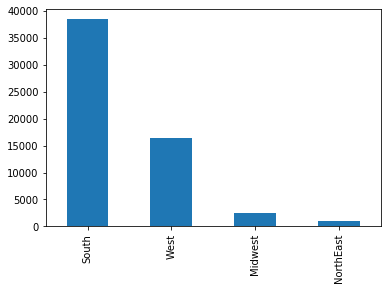

In [32]:
# Possiamo fare il binning di VNST raggruppando per area geografica
West= ['AZ', 'CO','UT','NV','NM','ID','OR','WA', 'CA']
Midwest= ['IA','IN','IL','OH','MO','MN','NE','MI']
South= ['TX','FL','MC','SC','OK','GA','TN','VA','MD','AL','NS','LA','WV','KY','AR', 'NC', 'MS']
NorthEast=['MA','NY','PA','NJ','NH']

df['USRegion'] = ['West' if region in West else 'Midwest' if region in Midwest else 'South' if region in South else 'NorthEast' for region in df.VNST ]

df['USRegion'].value_counts().plot(kind='bar')


## Missing values
In the cell below there is an overview on missing values. Missing values will be discussed for each variables in the sections below.

In [33]:
df.isnull().sum()

RefId                                0    
IsBadBuy                             0    
PurchDate                            0    
Auction                              0    
VehYear                              0    
VehicleAge                           0    
Make                                 0    
Model                                0    
Trim                                 1911 
SubModel                             7    
Color                                7    
Transmission                         8    
WheelTypeID                          2573 
WheelType                            2577 
VehOdo                               0    
Nationality                          4    
Size                                 4    
TopThreeAmericanName                 4    
MMRAcquisitionAuctionAveragePrice    13   
MMRAcquisitionAuctionCleanPrice      13   
MMRAcquisitionRetailAveragePrice     13   
MMRAcquisitonRetailCleanPrice        13   
MMRCurrentAuctionAveragePrice        245  
MMRCurrentA

Dato che "AUCGUART" e "PRIMEUNIT" mancano sul 96% del dataset, non consideriamo questi attributi.

In [34]:
del df['PRIMEUNIT']
del df['AUCGUART']
del df['BYRNO']

## Variables distribution

In the cell below we'll observe the value distributions of some attributes. We start from categorical ones by using bar charts for categorical attributes and histograms for numerical attributes.

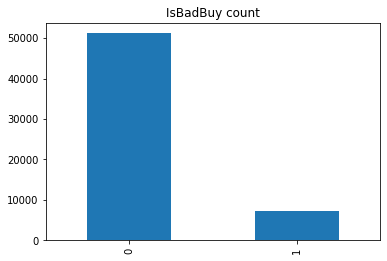

In [35]:
df['IsBadBuy'].value_counts().plot(kind='bar', title='IsBadBuy count')
plt.savefig('./plots/isbadbuy_hist.png')
plt.show()

### PurchDate

Indica la data di acquisto all'asta del veicolo

In [36]:
#PurchDateBadBuy = pd.crosstab(
#    df['PurchDate'].groupby([df['PurchDate'].dt.month,df['PurchDate'].dt.year]), 
#    df['IsBadBuy'].groupby([df['PurchDate'].dt.month,df['PurchDate'].dt.year]))
#PurchDateBadBuy_normalizzata = PurchDateBadBuy.div(PurchDateBadBuy.sum(1).astype(float), axis=0)
#PurchDateBadBuy_normalizzata.plot(kind='bar', stacked=True, 
#                   title='Rapporto qualità per cambio')
#plt.xlabel('Transmission')
#plt.ylabel('IsBadBuy')
#
#plt.show()


### Transmission
Transmission can be either "AUTO" or "MANUAL" according to the dataset description.
Since we observed the presence of one value set to "Manual" (lowercase), the first command in the cell below fix it.

There are just 8 missings, we can discard/ignore them or assume they are AUTO by considering the distribution below.

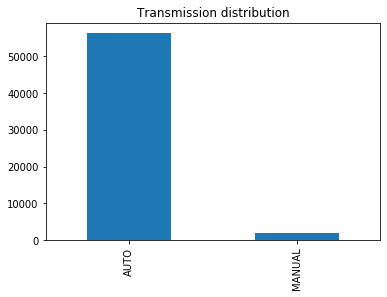

In [37]:

df['Transmission'] = df['Transmission'].str.upper() # because there was one "Manual"

df['Transmission'].value_counts().plot(kind='bar', title='Transmission distribution')
plt.savefig('./plots/transmission_hist.png')
plt.show()


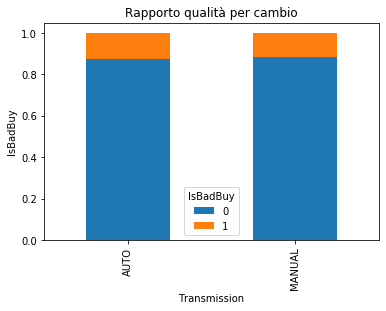

In [38]:

tabellaTransmissionBadBuy = pd.crosstab(df['Transmission'], df['IsBadBuy'])
tabellaTransmissionBadBuy_normalizzata = tabellaTransmissionBadBuy.div(tabellaTransmissionBadBuy.sum(1).astype(float), axis=0)
tabellaTransmissionBadBuy_normalizzata.plot(kind='bar', stacked=True, 
                   title='Rapporto qualità per cambio')
plt.xlabel('Transmission')
plt.ylabel('IsBadBuy')

plt.show()


Dal grafico sopra possiamo dedurre che il tipo di trasmissione non incide sull'attributo "IsBadBuy".

### Wheel type
WheelType variable can be "Alloy", "Covers or "Special". The column "WheelTypeID" it's redundat, 1 means alloy, 2 means Covers and 3 means Special. 0s and other values in WheelTypedID have to be treated as missings.

There are 2577 missing values.

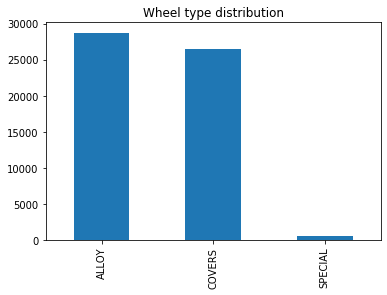

1.0    28735
2.0    26485
3.0    589  
0.0    4    
Name: WheelTypeID, dtype: int64

In [39]:

# bar chart are good for categorical attributes
# bar chart of wheel type:
df['WheelType'] = df['WheelType'].str.upper() 
df['WheelType'].value_counts().plot(kind='bar', title='Wheel type distribution')
plt.show()
# Missing: 2577

df['WheelTypeID'].value_counts()


Text(0, 0.5, 'IsBadBuy')

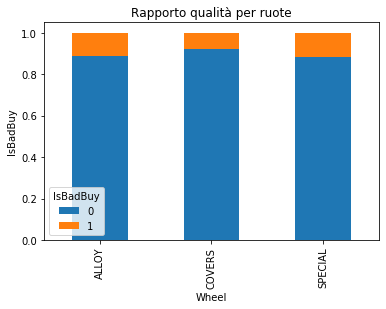

In [40]:
#WheelType e WheelTypeID sono perfettamente uguali. Ad 1.0 corrisponde Alloy, ecc.

tabellaWheelBadBuy = pd.crosstab(df['WheelType'], df['IsBadBuy'])
tabellaWheelBadBuy_normalizzata = tabellaWheelBadBuy.div(tabellaWheelBadBuy.sum(1).astype(float), axis=0)
tabellaWheelBadBuy_normalizzata.plot(kind='bar', stacked=True, 
                   title='Rapporto qualità per ruote')
plt.xlabel('Wheel')
plt.ylabel('IsBadBuy')


### Size
Size of the vehicle. There are just 4 missing values, we can easily assume they are "MEDIUM".

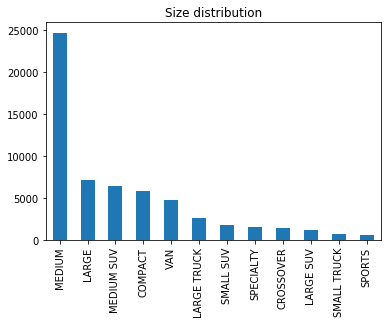

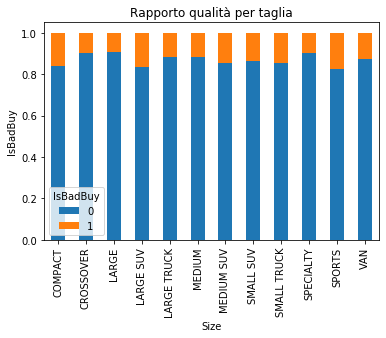

In [41]:
df['Size'].value_counts().plot(kind='bar', title='Size distribution')
plt.show()

SizeBadBuy = pd.crosstab(df['Size'], df['IsBadBuy'])
SizeBadBuy_normalizzata = SizeBadBuy.div(SizeBadBuy.sum(1).astype(float), axis=0)
SizeBadBuy_normalizzata.plot(kind='bar', stacked=True, 
                   title='Rapporto qualità per taglia')
plt.xlabel('Size')
plt.ylabel('IsBadBuy')
plt.show()

In [42]:
df[df['Size'].isnull()]

,RefId,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost,ModelSimple,Doors,USRegion
15769,10897,0,10/19/2009,MANHEIM,2002,7,GMC,SIERRA 1500,SL,BASE,WHITE,AUTO,2.0,COVERS,78288,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,27542,NC,7500.0,0,1455,SIERRA 1500,NaN,South
18532,25187,0,12/10/2009,OTHER,2008,1,DODGE,NITRO 4WD V6,SXT,SUV 3.7L SE,WHITE,AUTO,1.0,ALLOY,82466,NaN,NaN,NaN,11209.0,12716.0,15075.0,16710.0,NaN,NaN,NaN,NaN,38637,MS,9745.0,0,983,NITRO,4D,South
20016,69980,0,2/17/2010,ADESA,2008,2,JEEP,PATRIOT 2WD 4C,SPO,SUV SPORT,SILVER,AUTO,2.0,COVERS,63822,NaN,NaN,NaN,8715.0,9933.0,13105.0,14129.0,NaN,NaN,NaN,NaN,85226,AZ,9655.0,0,825,PATRIOT,4D,West
35157,69990,0,2/24/2010,ADESA,2008,2,JEEP,PATRIOT 2WD 4C,SPO,SUV SPORT,BLACK,AUTO,2.0,COVERS,61596,NaN,NaN,NaN,8759.0,9966.0,13397.0,14222.0,10159.0,11695.0,14026.0,15410.0,85226,AZ,9955.0,0,825,PATRIOT,4D,West


Nella tabella sopra possiamo osservare che due Jeep Patriot sono state acquistate dallo stesso compratore a 7gg di distanza... questa entry potrebbe essere un duplicato?

### Make
There aren't missing values but many have a very low frequency. Are "Toyota" and "Toyota Scion" the same?

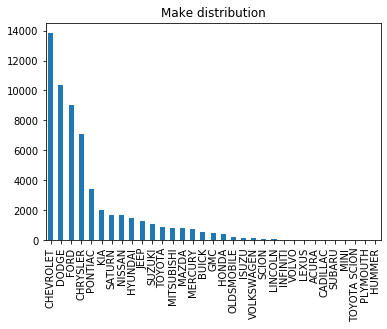

In [43]:
df['Make'].value_counts().plot(kind='bar', title='Make distribution')
plt.show()

In [44]:
df['Make'].value_counts()

CHEVROLET       13842
DODGE           10355
FORD            9000 
CHRYSLER        7093 
PONTIAC         3421 
KIA             2006 
SATURN          1698 
NISSAN          1687 
HYUNDAI         1444 
JEEP            1287 
SUZUKI          1062 
TOYOTA          905  
MITSUBISHI      822  
MAZDA           774  
MERCURY         739  
BUICK           562  
GMC             502  
HONDA           407  
OLDSMOBILE      198  
ISUZU           110  
VOLKSWAGEN      104  
SCION           102  
LINCOLN         80   
INFINITI        36   
VOLVO           31   
LEXUS           27   
ACURA           25   
CADILLAC        25   
SUBARU          22   
MINI            17   
TOYOTA SCION    1    
PLYMOUTH        1    
HUMMER          1    
Name: Make, dtype: int64

In [45]:
df.groupby('Make')['ModelSimple'].value_counts()

Make          ModelSimple         
ACURA         TL                      16  
              MDX                     4   
              RSX                     2   
              TSX                     2   
              CL                      1   
BUICK         CENTURY                 141 
              LACROSSE                113 
              RENDEZVOUS              109 
              LE SABRE                107 
              REGAL                   33  
              RAINIER                 26  
              PARK AVENUE             12  
              TERRAZA                 12  
              LUCERNE                 9   
CADILLAC      CTS                     16  
              SRX                     7   
              STS                     2   
CHEVROLET     IMPALA                  3879
              MALIBU                  2407
              COBALT                  1281
              TRAILBLAZER             1118
              UPLANDER                772 
              HHR  

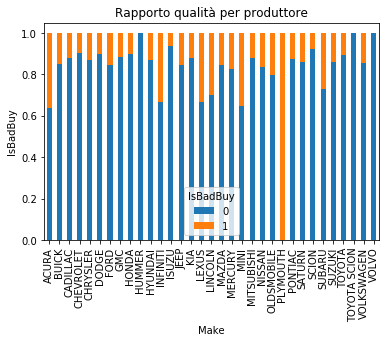

In [46]:
tabellaMakeBadBuy = pd.crosstab(df['Make'], df['IsBadBuy'])
tabellaMakeBadBuy_normalizzata = tabellaMakeBadBuy.div(tabellaMakeBadBuy.sum(1).astype(float), axis=0)
tabellaMakeBadBuy_normalizzata.plot(kind='bar', stacked=True, 
                   title='Rapporto qualità per produttore')
plt.xlabel('Make')
plt.ylabel('IsBadBuy')
plt.show()


### Model, Trim e SubModel

In [47]:
len(df['Model'].unique())

1006

In [48]:
len(df['Trim'].unique())

131

In [49]:
df['Trim'].isnull().sum()

1911

In [50]:
len(df['SubModel'].unique())

820

### Vehicle year and Vehicle age

_VehYear_ indicates the year of production of the vehicle and _VehicleAge_ indicates the age (how many years from production) of the vehicle.

For both the attributes there are not missing values.

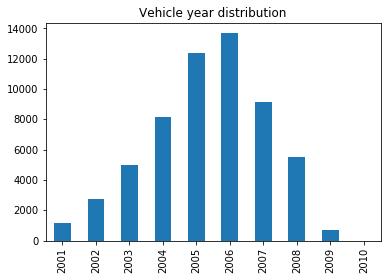

In [51]:
df['VehYear'].value_counts().sort_index().plot(kind='bar', title='Vehicle year distribution')
plt.show()

As we can se from the graph below, there is not an exact correspondace between the distributions years and ages.
This is a problem and we think there are errors.

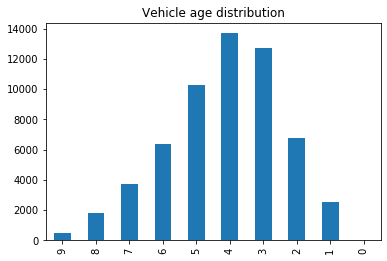

In [52]:
df['VehicleAge'].value_counts().sort_index(ascending=False).plot(kind='bar', title='Vehicle age distribution') # actually there are 10 different values
plt.show()

Assuming errors are in _VehYear_ we can correct ages as follows.

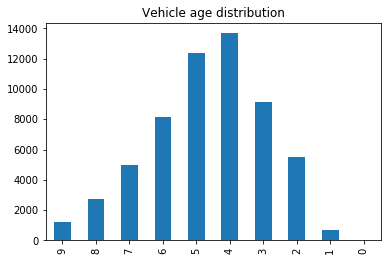

In [53]:
# There is some noise in Vehicle Age, vehicle with same years should have same age.
# We take 2010 as "limit year" and compute veh age according to it

df_copy = df.copy(deep=True)

for i, row in df.iterrows():
    df_copy.at[i, 'VehicleAge'] = 2010 - df_copy.at[i, 'VehYear']

df_copy['VehicleAge'].value_counts().sort_index(ascending=False).plot(kind='bar', title='Vehicle age distribution') # actually there are 10 different values
plt.show()

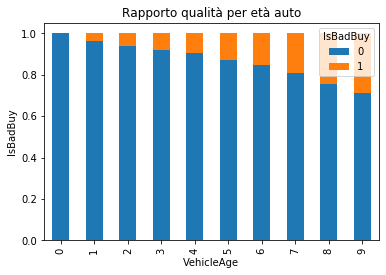

In [54]:
tabellaVehicleAgeBadBuy = pd.crosstab(df_copy['VehicleAge'], df_copy['IsBadBuy'])
tabellaVehicleAgeBadBuy_normalizzata = tabellaVehicleAgeBadBuy.div(tabellaVehicleAgeBadBuy.sum(1).astype(float), axis=0)
tabellaVehicleAgeBadBuy_normalizzata.plot(kind='bar', stacked=True, 
                   title='Rapporto qualità per età auto')
plt.xlabel('VehicleAge')
plt.ylabel('IsBadBuy')

plt.show()

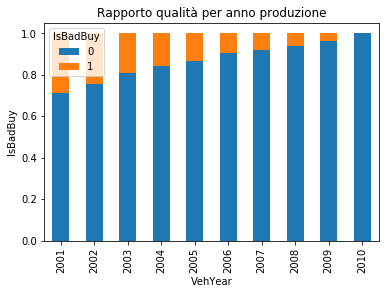

In [55]:
tabellaAnnoProduzioneBadBuy = pd.crosstab(df_copy['VehYear'], df_copy['IsBadBuy'])
tabellaAnnoProduzioneBadBuy_normalizzata = tabellaAnnoProduzioneBadBuy.div(tabellaAnnoProduzioneBadBuy.sum(1).astype(float), axis=0)
tabellaAnnoProduzioneBadBuy_normalizzata.plot(kind='bar', stacked=True, 
                   title='Rapporto qualità per anno produzione')
plt.xlabel('VehYear')
plt.ylabel('IsBadBuy')

plt.show()

I due attributi sopra sono ridondanti, decidiamo di mantenere solo __VehicleAge__ come attributo numerico discreto.

In [56]:
del df['VehYear']

### Nationality

Most of the vehicle are American. There are just 4 missing values. Is it possibile to establish a hierarchy between Asian vehicle?

In [57]:
df[df['Nationality'].isnull()]

,RefId,IsBadBuy,PurchDate,Auction,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost,ModelSimple,Doors,USRegion
15769,10897,0,10/19/2009,MANHEIM,7,GMC,SIERRA 1500,SL,BASE,WHITE,AUTO,2.0,COVERS,78288,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,27542,NC,7500.0,0,1455,SIERRA 1500,NaN,South
18532,25187,0,12/10/2009,OTHER,1,DODGE,NITRO 4WD V6,SXT,SUV 3.7L SE,WHITE,AUTO,1.0,ALLOY,82466,NaN,NaN,NaN,11209.0,12716.0,15075.0,16710.0,NaN,NaN,NaN,NaN,38637,MS,9745.0,0,983,NITRO,4D,South
20016,69980,0,2/17/2010,ADESA,2,JEEP,PATRIOT 2WD 4C,SPO,SUV SPORT,SILVER,AUTO,2.0,COVERS,63822,NaN,NaN,NaN,8715.0,9933.0,13105.0,14129.0,NaN,NaN,NaN,NaN,85226,AZ,9655.0,0,825,PATRIOT,4D,West
35157,69990,0,2/24/2010,ADESA,2,JEEP,PATRIOT 2WD 4C,SPO,SUV SPORT,BLACK,AUTO,2.0,COVERS,61596,NaN,NaN,NaN,8759.0,9966.0,13397.0,14222.0,10159.0,11695.0,14026.0,15410.0,85226,AZ,9955.0,0,825,PATRIOT,4D,West


I veicoli con nazionalità missing sono gli stessi con Size missing.

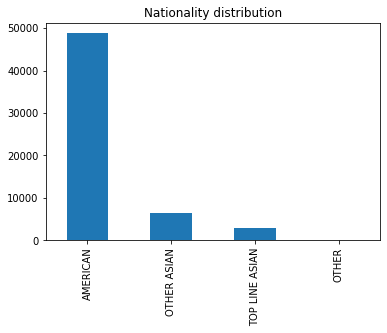

AMERICAN          48800
OTHER ASIAN       6435 
TOP LINE ASIAN    2995 
OTHER             152  
Name: Nationality, dtype: int64

In [58]:
df['Nationality'].value_counts().plot(kind='bar', title='Nationality distribution')
plt.show()

df['Nationality'].value_counts()

In [59]:
df['Nationality'].groupby(df['Make']).value_counts()

Make          Nationality   
ACURA         OTHER ASIAN       25   
BUICK         AMERICAN          562  
CADILLAC      AMERICAN          25   
CHEVROLET     AMERICAN          13842
CHRYSLER      AMERICAN          7093 
DODGE         AMERICAN          10354
FORD          AMERICAN          9000 
GMC           AMERICAN          501  
HONDA         TOP LINE ASIAN    407  
HUMMER        AMERICAN          1    
HYUNDAI       OTHER ASIAN       1444 
INFINITI      OTHER ASIAN       36   
ISUZU         OTHER ASIAN       110  
JEEP          AMERICAN          1285 
KIA           OTHER ASIAN       2006 
LEXUS         OTHER ASIAN       27   
LINCOLN       AMERICAN          80   
MAZDA         OTHER ASIAN       774  
MERCURY       AMERICAN          739  
MINI          OTHER             17   
MITSUBISHI    OTHER ASIAN       822  
NISSAN        TOP LINE ASIAN    1687 
OLDSMOBILE    AMERICAN          198  
PLYMOUTH      AMERICAN          1    
PONTIAC       AMERICAN          3421 
SATURN        AMERICA

C'è un errore sulla nazionalità delle toyota

Posso fixare i 4 missing per quanto riguarda l'attributo __Nationality__

Text(0, 0.5, 'IsBadBuy')

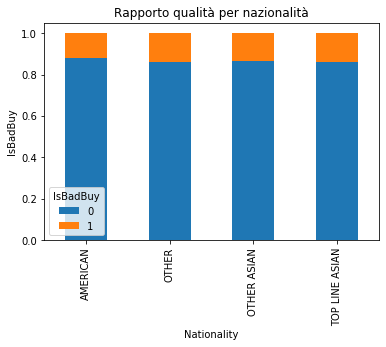

In [60]:
tabellaNationalityBadBuy = pd.crosstab(df['Nationality'], df['IsBadBuy'])
tabellaNationalityBadBuy_normalizzata = tabellaNationalityBadBuy.div(tabellaNationalityBadBuy.sum(1).astype(float), axis=0)
tabellaNationalityBadBuy_normalizzata.plot(kind='bar', stacked=True, 
                   title='Rapporto qualità per nazionalità')
plt.xlabel('Nationality')
plt.ylabel('IsBadBuy')


### Color

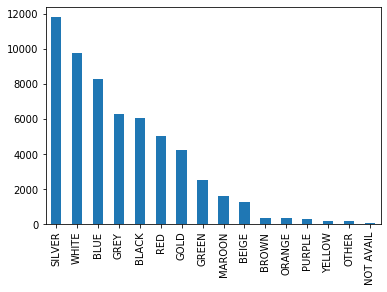

In [61]:
df['Color'].value_counts().plot(kind='bar')
plt.show()

__NOT AVAIL__ è un missing value

In [62]:
df[(df['Color'].isnull())]

,RefId,IsBadBuy,PurchDate,Auction,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost,ModelSimple,Doors,USRegion
23019,70466,0,1/15/2009,ADESA,5,CHEVROLET,IMPALA 3.4L V6 SFI,BAS,NaN,NaN,NaN,NaN,NaN,82062,AMERICAN,LARGE,GM,3967.0,5101.0,4784.0,6009.0,4023.0,5219.0,4845.0,6137.0,78227,TX,4470.0,0,2152,IMPALA,NaN,South
28280,70482,0,1/15/2009,ADESA,3,FORD,FREESTAR FWD V6 3.9L,SE,NaN,NaN,NaN,NaN,NaN,80212,AMERICAN,VAN,FORD,4899.0,6033.0,5791.0,7016.0,5750.0,7186.0,6710.0,8261.0,78227,TX,4970.0,0,1633,FREESTAR,NaN,South
28961,70469,0,1/15/2009,ADESA,5,PONTIAC,GRAND AM V6 3.4L V6,SE,NaN,NaN,NaN,NaN,NaN,86471,AMERICAN,MEDIUM,GM,3332.0,4435.0,4099.0,5290.0,3810.0,5001.0,4615.0,5901.0,78227,TX,4170.0,0,2412,GRAND AM,NaN,South
33225,70478,1,1/15/2009,ADESA,7,MERCURY,MOUNTAINEER 2WD V8 4,NaN,NaN,NaN,NaN,NaN,NaN,85546,AMERICAN,MEDIUM SUV,FORD,3779.0,5143.0,4581.0,6054.0,3779.0,5143.0,4581.0,6054.0,78227,TX,5180.0,0,2193,MOUNTAINEER,NaN,South
35224,24596,0,6/24/2009,MANHEIM,3,DODGE,STRATUS V6 2.7L V6 M,SXT,NaN,NaN,NaN,NaN,NaN,60781,AMERICAN,MEDIUM,CHRYSLER,5480.0,6461.0,6418.0,7478.0,5616.0,6535.0,6565.0,7558.0,32124,FL,6200.0,0,1215,STRATUS,NaN,South
48641,24585,0,6/24/2009,MANHEIM,3,DODGE,STRATUS V6 2.7L V6 M,SXT,NaN,NaN,NaN,NaN,NaN,46150,AMERICAN,MEDIUM,CHRYSLER,5480.0,6461.0,6418.0,7478.0,5480.0,6461.0,6418.0,7478.0,32124,FL,6200.0,0,975,STRATUS,NaN,South
50661,70464,0,1/15/2009,ADESA,8,CHEVROLET,S10 PICKUP 2WD 4C 2.,BAS,NaN,NaN,NaN,NaN,NaN,81122,AMERICAN,SMALL TRUCK,GM,2495.0,3411.0,3195.0,4184.0,2858.0,3800.0,3587.0,4604.0,78227,TX,4770.0,0,2322,S10 PICKUP,NaN,South


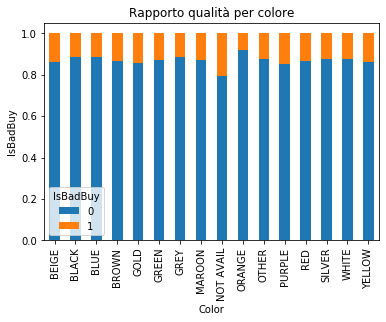

In [63]:
ColorBadBuy = pd.crosstab(df['Color'], df['IsBadBuy'])
ColorBadBuy_normalizzata = ColorBadBuy.div(ColorBadBuy.sum(1).astype(float), axis=0)
ColorBadBuy_normalizzata.plot(kind='bar', stacked=True, 
                   title='Rapporto qualità per colore')
plt.xlabel('Color')
plt.ylabel('IsBadBuy')

plt.show()

### Prices

Prices are divided into 2 main categories: _Auction_ and _Retail_. Each of these two category is sub-divided into 4 more sub-categories:
- Acquisition Retail: prices of the vehicle in the retail market at time of purchase
- Acquisition Auction: prices of the vehicle a at time of (auction) purchase
- Current Retail: acutal retail price
- Current Auction: acutal auction price

Vehicle prices refer to the vehicle status:
- Clean: vehicle is in above average conditions
- Average: vehicle is in average condition

There are less than 250 missing values (NaN) for the each of the 8 categories.

In [64]:
df[['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitionRetailAveragePrice', 
    'MMRAcquisitonRetailCleanPrice', 'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice',
    'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice', 'VehBCost']].describe()

,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VehBCost
count,58373.000000,58373.000000,58373.000000,58373.000000,58141.000000,58141.000000,58141.000000,58141.000000,58386.000000
mean,6128.127953,7372.912699,8497.288558,9851.768061,6131.666655,7389.958652,8776.065118,10145.227034,6730.008335
std,2456.632611,2715.506462,3151.106237,3378.839613,2432.171539,2682.310828,3086.373733,3304.637060,1762.075265
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4273.000000,5409.000000,6279.000000,7501.000000,4275.000000,5415.000000,6538.000000,7788.000000,5430.000000
50%,6097.000000,7308.000000,8448.000000,9798.000000,6063.000000,7311.000000,8733.000000,10103.000000,6700.000000
75%,7765.000000,9017.000000,10652.000000,12084.000000,7737.000000,9014.000000,10910.000000,12309.000000,7900.000000
max,35722.000000,36859.000000,39080.000000,41482.000000,35722.000000,36859.000000,39080.000000,41062.000000,36485.000000


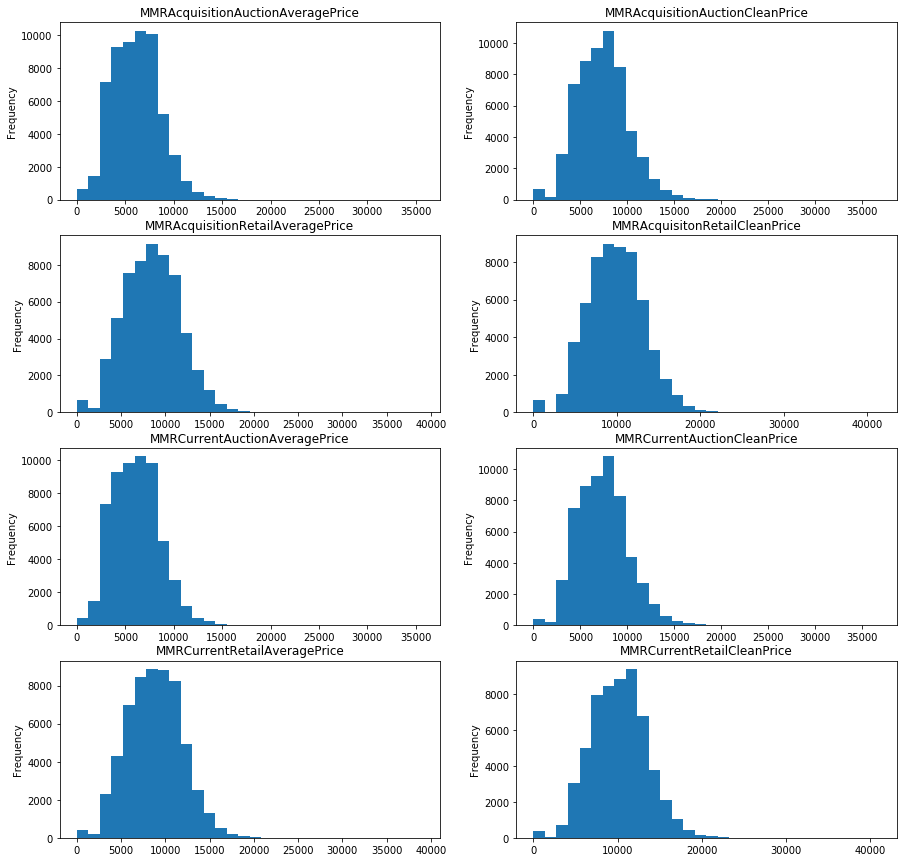

In [65]:
"""
Considerazione su questi grafici: potete notare con df['NOME_ATTR'].value_counts() che ci sono molti valori a 0 
per ognuno degli attributi qua sotto, pensavo che forse sarebbero da considerarsi nulli e quindi eliminarli oppure 
sostituirli con la media calcolata escludendoli.
"""

# Set up a grid of plots
fig = plt.figure(figsize=(15, 15)) 
fig_dims = (4, 2)

# Acquisition price for this vehicle in average condition at time of purchase
plt.subplot2grid(fig_dims, (0, 0))
df['MMRAcquisitionAuctionAveragePrice'].plot(bins=30, kind='hist', title='MMRAcquisitionAuctionAveragePrice')

# Acquisition price for this vehicle in the above Average condition at time of purchase
plt.subplot2grid(fig_dims, (0, 1))
df['MMRAcquisitionAuctionCleanPrice'].plot(kind='hist', bins=30, title='MMRAcquisitionAuctionCleanPrice')

# Acquisition price for this vehicle in the retail market in average condition at time of purchase
plt.subplot2grid(fig_dims, (1, 0))
df['MMRAcquisitionRetailAveragePrice'].plot(kind='hist', bins=30, 
                                                           title='MMRAcquisitionRetailAveragePrice')
plt.xticks(rotation=0)

# Acquisition price for this vehicle in the retail market in above average condition at time of purchase
plt.subplot2grid(fig_dims, (1, 1))
df['MMRAcquisitonRetailCleanPrice'].plot(kind='hist', bins=30, 
                                                        title='MMRAcquisitonRetailCleanPrice')

# Acquisition price for this vehicle in average condition as of current day
plt.subplot2grid(fig_dims, (2, 0))
df['MMRCurrentAuctionAveragePrice'].plot(kind='hist', bins=30, 
                                                        title='MMRCurrentAuctionAveragePrice')

# Acquisition price for this vehicle in the above condition as of current day
plt.subplot2grid(fig_dims, (2, 1))
df['MMRCurrentAuctionCleanPrice'].plot(kind='hist', bins=30, 
                                                        title='MMRCurrentAuctionCleanPrice')

# Acquisition price for this vehicle in the retail market in average condition as of current day
plt.subplot2grid(fig_dims, (3, 0))
df['MMRCurrentRetailAveragePrice'].plot(kind='hist', bins=30, 
                                                        title='MMRCurrentRetailAveragePrice')

# Acquisition price for this vehicle in the retail market in above average condition as of current day
plt.subplot2grid(fig_dims, (3, 1))
df['MMRCurrentRetailCleanPrice'].plot(kind='hist', bins=30, 
                                                        title='MMRCurrentRetailCleanPrice')

plt.savefig('./plots/MMRs_with_nan.png')
plt.show()

As we can see from the plots above, for some vehicle the prices are very low.
With a careful analysis we can notice that some prices are either 0 or 1, as shown by the code below:

In [66]:
df[['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitionRetailAveragePrice', 
    'MMRAcquisitonRetailCleanPrice', 'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice',
    'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice']].isin([0, 1]).sum()

# Non ho trovato un modo migliore...

MMRAcquisitionAuctionAveragePrice    648
MMRAcquisitionAuctionCleanPrice      648
MMRAcquisitionRetailAveragePrice     648
MMRAcquisitonRetailCleanPrice        648
MMRCurrentAuctionAveragePrice        393
MMRCurrentAuctionCleanPrice          393
MMRCurrentRetailAveragePrice         393
MMRCurrentRetailCleanPrice           393
dtype: int64

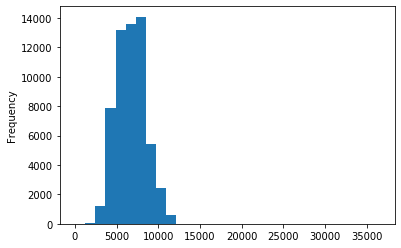

In [67]:
df['VehBCost'].plot(kind='hist', bins=30)
plt.show()

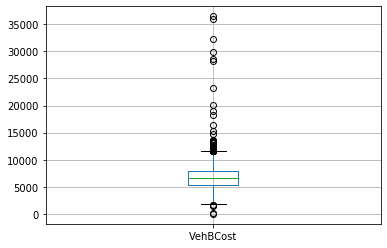

In [68]:
df.boxplot('VehBCost')
plt.show()

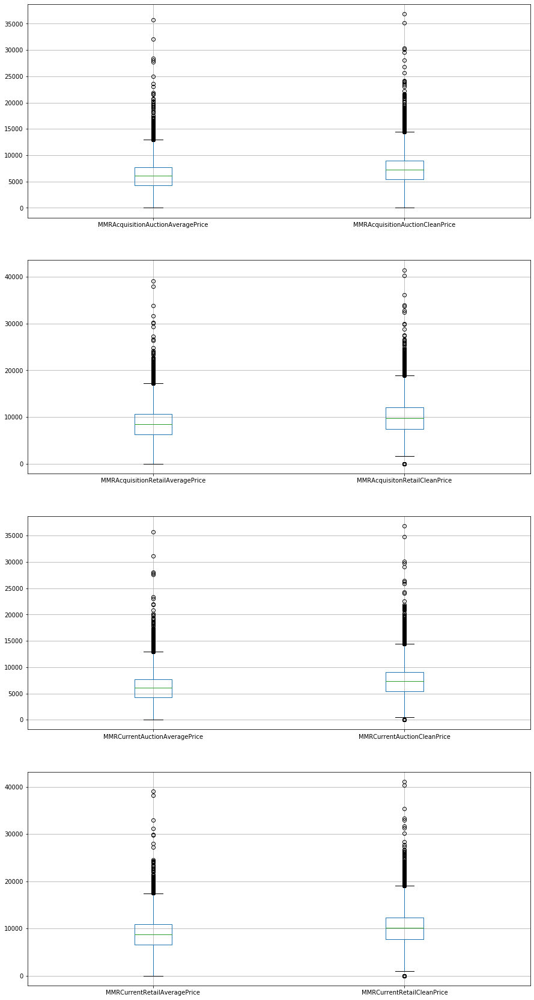

In [69]:
# Set up a grid of plots
fig = plt.figure(figsize=(15, 30)) 
fig_dims = (4, 1)

plt.subplot2grid(fig_dims, (0, 0))
df.boxplot(['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice'])

plt.subplot2grid(fig_dims, (1, 0))
df.boxplot(['MMRAcquisitionRetailAveragePrice', 'MMRAcquisitonRetailCleanPrice'])

plt.xticks(rotation=0)

plt.subplot2grid(fig_dims, (2, 0))
df.boxplot(['MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice'])

plt.subplot2grid(fig_dims, (3, 0))
df.boxplot(['MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice'])


plt.show()

What does it means for a price to be 0 or 1? Maybe it can be considered missing.

### Vehicle Odometer
This attribute describe the distance covered by a vehicle during its life. There are not missing values.

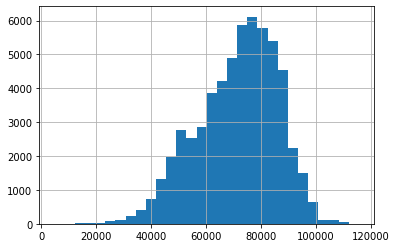

In [70]:
df['VehOdo'].hist(bins=30)
plt.show()

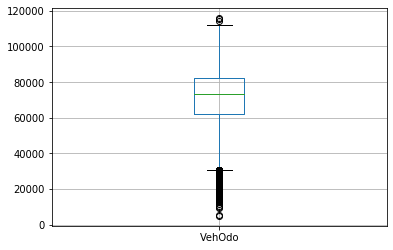

In [71]:
df.boxplot('VehOdo')
plt.show()

### Warranty Cost

Warranty price, there are not missing values.

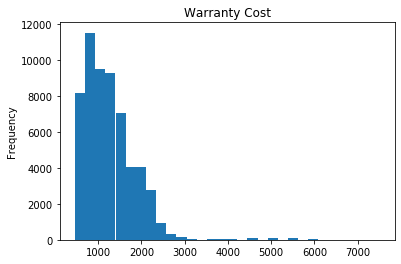

In [72]:
df['WarrantyCost'].plot(kind='hist', bins=30, title='Warranty Cost')
plt.show()

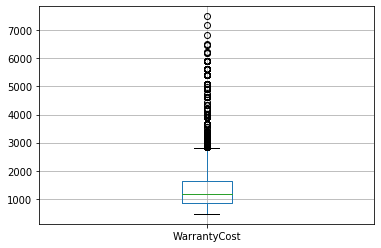

In [73]:
df.boxplot('WarrantyCost')
plt.show()

### Top Three American Name

In [74]:
df.groupby('Make')['TopThreeAmericanName'].value_counts()

Make          TopThreeAmericanName
ACURA         OTHER                   25   
BUICK         GM                      562  
CADILLAC      GM                      25   
CHEVROLET     GM                      13842
CHRYSLER      CHRYSLER                7093 
DODGE         CHRYSLER                10354
FORD          FORD                    9000 
GMC           GM                      501  
HONDA         OTHER                   407  
HUMMER        GM                      1    
HYUNDAI       OTHER                   1444 
INFINITI      OTHER                   36   
ISUZU         OTHER                   110  
JEEP          CHRYSLER                1285 
KIA           OTHER                   2006 
LEXUS         OTHER                   27   
LINCOLN       FORD                    80   
MAZDA         OTHER                   774  
MERCURY       FORD                    739  
MINI          OTHER                   17   
MITSUBISHI    OTHER                   822  
NISSAN        OTHER                   168

## Data integrity

In questa sezione verifichaimo che alcuni vincoli semantici vengano rispettati.

1. Le macchine di uno stesso __ModelSimple__ devono avere lo stesso __Make__

In [75]:
candidates_outlier =  pd.DataFrame(columns=df.columns)

def check(group_data):
    find_outliers(group_data, 'Make', False)
    
df.groupby('ModelSimple').apply(check)

candidates_outlier[['Make','ModelSimple']]

,Make,ModelSimple
0,PLYMOUTH,NEON
1,TOYOTA SCION,XA


In [76]:
df[(df['Make']=='PLYMOUTH') | (df['Model']=='NEON')].head()

,RefId,IsBadBuy,PurchDate,Auction,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost,ModelSimple,Doors,USRegion
48,43702,0,2/17/2010,MANHEIM,5,DODGE,NEON,SXT,SEDAN,RED,AUTO,1.0,ALLOY,84173,AMERICAN,COMPACT,CHRYSLER,3440.0,4515.0,6509.0,8155.0,3044.0,4085.0,6263.0,7457.0,22801,VA,5340.0,0,723,NEON,4D,South
323,19919,0,12/1/2009,OTHER,4,DODGE,NEON,SE,SEDAN,WHITE,AUTO,2.0,COVERS,64621,AMERICAN,COMPACT,CHRYSLER,2879.0,3864.0,3609.0,4673.0,2693.0,3499.0,6065.0,7071.0,95673,CA,4090.0,0,630,NEON,4D,West
601,16923,0,3/3/2010,MANHEIM,5,DODGE,NEON,SXT,SEDAN,SILVER,AUTO,1.0,ALLOY,76522,AMERICAN,COMPACT,CHRYSLER,3748.0,4758.0,6731.0,7929.0,3092.0,4102.0,6412.0,7587.0,32824,FL,4700.0,0,686,NEON,4D,South
694,36665,0,11/13/2009,MANHEIM,4,DODGE,NEON,SXT,SEDAN SXT,BLUE,AUTO,1.0,ALLOY,82843,AMERICAN,COMPACT,CHRYSLER,3358.0,4331.0,4127.0,5177.0,3368.0,4311.0,6905.0,8287.0,75236,TX,3040.0,0,723,NEON,4D,South
1539,2631,0,10/19/2010,ADESA,5,DODGE,NEON,SXT,SEDAN,RED,MANUAL,1.0,ALLOY,50550,AMERICAN,COMPACT,CHRYSLER,3345.0,4367.0,6287.0,7755.0,3313.0,4276.0,5989.0,7255.0,45005,OH,4025.0,0,588,NEON,4D,Midwest


Con una semplice ricerca su google possiamo notare che __Plymouth__ è un marchio __Chrysler__ chiuso nel 2001.

Nella fase di __Data Preparation__ potremmo correggere __Plymouth__ in __Dodge__ perchè tutte le altre __Neon__ sono __Dodge__ (anch'esso marchio __Chrysler__).

Le Macchine con __ModelSimple__ = XA sono tutte SCION e infatti "TOYOTA SCION" è errato

In [77]:
df[df.ModelSimple=='XA']

,RefId,IsBadBuy,PurchDate,Auction,VehicleAge,Make,Model,Trim,SubModel,Color,Transmission,WheelTypeID,WheelType,VehOdo,Nationality,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost,ModelSimple,Doors,USRegion
6453,24788,0,10/13/2010,MANHEIM,4,SCION,XA,BAS,HATCHBACK,BLUE,AUTO,2.0,COVERS,77301,OTHER ASIAN,COMPACT,OTHER,6797.0,7642.0,9930.0,10905.0,5845.0,7224.0,9234.0,10743.0,32124,FL,6550.0,0,569,XA,4D,South
12039,16884,1,2/24/2010,MANHEIM,4,SCION,XA,BAS,HATCHBACK,BLUE,AUTO,2.0,COVERS,60356,OTHER ASIAN,COMPACT,OTHER,6960.0,8168.0,10459.0,11760.0,6448.0,7540.0,9889.0,11004.0,32824,FL,6500.0,0,533,XA,4D,South
12415,16893,0,2/24/2010,MANHEIM,5,SCION,XA,BAS,HATCHBACK,GREY,AUTO,2.0,COVERS,68454,OTHER ASIAN,COMPACT,OTHER,5662.0,6861.0,8656.0,10181.0,6224.0,7370.0,8886.0,10102.0,32824,FL,6900.0,0,533,XA,4D,South
16824,13224,0,12/6/2010,MANHEIM,5,SCION,XA,BAS,HATCHBACK,BLACK,AUTO,2.0,COVERS,74647,OTHER ASIAN,COMPACT,OTHER,5333.0,6187.0,8378.0,8913.0,5019.0,6300.0,7951.0,9391.0,27542,NC,5900.0,0,569,XA,4D,South
20136,51745,0,2/24/2010,MANHEIM,4,SCION,XA,BAS,HATCHBACK,SILVER,AUTO,2.0,COVERS,95525,OTHER ASIAN,COMPACT,OTHER,6960.0,8168.0,10459.0,11760.0,6618.0,8060.0,9262.0,11855.0,80011,CO,6455.0,0,620,XA,4D,West
26346,46094,0,9/29/2010,MANHEIM,4,SCION,XA,BAS,HATCHBACK,BLACK,AUTO,2.0,COVERS,57134,OTHER ASIAN,COMPACT,OTHER,6818.0,7959.0,10248.0,11821.0,5981.0,7349.0,9350.0,10665.0,64161,MO,7170.0,0,505,XA,4D,Midwest
37034,62771,0,2/9/2010,MANHEIM,5,SCION,XA,BAS,HATCHBACK,GREY,AUTO,2.0,COVERS,84082,OTHER ASIAN,COMPACT,OTHER,5486.0,6764.0,8515.0,9929.0,6104.0,7209.0,9214.0,10605.0,28625,NC,5795.0,0,594,XA,4D,South
42627,17866,0,10/13/2009,OTHER,4,TOYOTA SCION,XA 1.5L I4 EFI,BAS,HATCHBACK,BLUE,AUTO,1.0,ALLOY,86440,OTHER ASIAN,COMPACT,OTHER,5270.0,6657.0,6192.0,7690.0,5614.0,6881.0,6563.0,7931.0,84104,UT,5560.0,0,594,XA,4D,West
50638,22547,0,11/19/2009,MANHEIM,3,SCION,XA,BAS,HATCHBACK,GREY,AUTO,2.0,COVERS,58125,OTHER ASIAN,COMPACT,OTHER,6840.0,8317.0,7887.0,9482.0,6963.0,8076.0,10233.0,11628.0,76040,TX,7125.0,0,505,XA,4D,South
53796,8717,0,9/2/2010,MANHEIM,5,SCION,XA,BAS,HATCHBACK,SILVER,MANUAL,2.0,COVERS,80968,OTHER ASIAN,COMPACT,OTHER,5369.0,6431.0,8615.0,9884.0,5072.0,6323.0,8222.0,9561.0,30272,GA,5495.0,0,594,XA,4D,South


In [78]:
df.loc[df.ModelSimple=='TOYOTA SCION', 'ModelSimple']='SCION'
df.loc[df.ModelSimple=='PLYMOUTH', 'ModelSimple']='DODGE'

Altro vincolo:

2. Tutte le macchine dello stesso __Make__ devono avere la stessa __Nationality__: 

In [79]:
candidates_outlier =  pd.DataFrame(columns=df.columns)

def check(group_data):
    find_outliers(group_data, 'Nationality', False)
    
df.groupby('Make').apply(check)

candidates_outlier[['Make','Nationality']]

,Make,Nationality
0,DODGE,NaN
1,GMC,NaN
2,JEEP,NaN
3,JEEP,NaN
4,TOYOTA,OTHER ASIAN
5,TOYOTA,OTHER ASIAN
6,TOYOTA,OTHER ASIAN
7,TOYOTA,OTHER ASIAN


3. Tutte le macchine di uno stesso __Model__ devono avere la stessa __Size__:

In [80]:
candidates_outlier =  pd.DataFrame(columns=df.columns)

def check(group_data):
    find_outliers(group_data, 'Size', False)
    
df.groupby('ModelSimple').apply(check)

candidates_outlier[['Make','ModelSimple', 'SubModel', 'Size']]

,Make,ModelSimple,SubModel,Size
0,SUZUKI,GRAND VITARA,SPORT UTILITY JS,SMALL SUV
1,SUZUKI,GRAND VITARA,SPORT UTILITY JLX,SMALL SUV
2,SUZUKI,GRAND VITARA,SPORT UTILITY JS,SMALL SUV
3,SUZUKI,GRAND VITARA,SPORT UTILITY JS,SMALL SUV
4,SUZUKI,GRAND VITARA,SPORT UTILITY JS,SMALL SUV
5,DODGE,NITRO,SUV 3.7L SE,NaN
6,JEEP,PATRIOT,SUV SPORT,NaN
7,JEEP,PATRIOT,SUV SPORT,NaN
8,GMC,SIERRA 1500,BASE,NaN
9,CADILLAC,SRX,SUV,MEDIUM SUV


4. Ad ogni __WheelType__ deve corrispondere il suo __WheelTypeID__

In [81]:
candidates_outlier =  pd.DataFrame(columns=df.columns)

def check(group_data):
    find_outliers(group_data, 'WheelType', False)
    
df.groupby('WheelTypeID').apply(check)

candidates_outlier[['WheelType', 'WheelTypeID']]

,WheelType,WheelTypeID
0,NaN,0.0
1,NaN,0.0
2,NaN,0.0
3,NaN,0.0


## Correlation between variables

In [82]:
df_copy = df.copy(deep=True)

# deleting numerical attributes that represent categorical attributes or are meaningless
del df_copy['IsBadBuy']
del df_copy['WheelTypeID']
del df_copy['VNZIP1']
del df_copy['IsOnlineSale']
del df_copy['RefId']

corr_mat = df_copy.corr(method='spearman') # Spearman's method tolerates outliers and considering boxplots above we have a lot
corr_mat.style.background_gradient(cmap='coolwarm')
#f = plt.figure(figsize=(19, 15))
#plt.matshow(corr_mat, fignum=f.number)
#plt.xticks(range(corr_mat.shape[1]), corr_mat.columns, fontsize=14, rotation=90)
#plt.yticks(range(corr_mat.shape[1]), corr_mat.columns, fontsize=14)
#cb = plt.colorbar()
#cb.ax.tick_params(labelsize=14)


,VehicleAge,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VehBCost,WarrantyCost
VehicleAge,1,0.307884,-0.602504,-0.558873,-0.484656,-0.4511,-0.610046,-0.569525,-0.527839,-0.493982,-0.323582,0.230705
VehOdo,0.307884,1,-0.0319897,0.0060638,0.0250592,0.056786,-0.0438454,-0.00728938,0.0080234,0.0392996,-0.0615609,0.452835
MMRAcquisitionAuctionAveragePrice,-0.602504,-0.0319897,1,0.990701,0.896546,0.894901,0.946425,0.941349,0.873025,0.871915,0.822604,0.00490917
MMRAcquisitionAuctionCleanPrice,-0.558873,0.0060638,0.990701,1,0.888555,0.901808,0.934743,0.942406,0.864232,0.873546,0.826451,0.0422457
MMRAcquisitionRetailAveragePrice,-0.484656,0.0250592,0.896546,0.888555,1,0.989656,0.84914,0.847246,0.919526,0.912788,0.771106,-0.0108602
MMRAcquisitonRetailCleanPrice,-0.4511,0.056786,0.894901,0.901808,0.989656,1,0.845611,0.853885,0.911282,0.915188,0.778081,0.0230554
MMRCurrentAuctionAveragePrice,-0.610046,-0.0438454,0.946425,0.934743,0.84914,0.845611,1,0.990789,0.905381,0.901988,0.804933,-0.0012828
MMRCurrentAuctionCleanPrice,-0.569525,-0.00728938,0.941349,0.942406,0.847246,0.853885,0.990789,1,0.898921,0.910342,0.809985,0.0345629
MMRCurrentRetailAveragePrice,-0.527839,0.0080234,0.873025,0.864232,0.919526,0.911282,0.905381,0.898921,1,0.989234,0.778092,-0.0104885
MMRCurrentRetailCleanPrice,-0.493982,0.0392996,0.871915,0.873546,0.912788,0.915188,0.901988,0.910342,0.989234,1,0.783675,0.0223012


### Auction

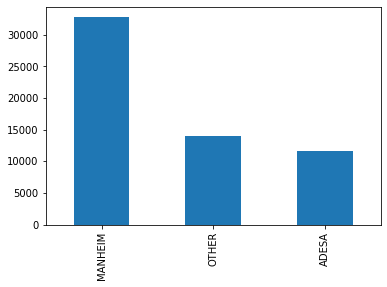

In [83]:
df['Auction'].value_counts().plot(kind='bar')

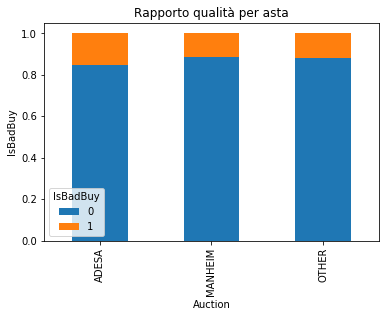

In [84]:
tabellaAuctionBadBuy = pd.crosstab(df['Auction'], df['IsBadBuy'])
tabellaAuctionBadBuy_normalizzata = tabellaAuctionBadBuy.div(tabellaAuctionBadBuy.sum(1).astype(float), axis=0)
tabellaAuctionBadBuy_normalizzata.plot(kind='bar', stacked=True, 
                   title='Rapporto qualità per asta')
plt.xlabel('Auction')
plt.ylabel('IsBadBuy')

plt.show()

In [85]:
df.to_csv(index=False, path_or_buf='./data/training_1st_corrections.csv')